# Load data

In [1]:
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
from ms_mint.notebook import Mint
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams["figure.facecolor"] = "w"
plt.rcParams["figure.dpi"] = 150
plt.rcParams['figure.constrained_layout.use'] = True

sns.set_context('paper')

mint = Mint()
mint.load('results.csv')

In [ ]:
mint.targets

# Plotting

## Chromatograms

In [4]:
mint.peak_labels

['Arabitol', 'Mevalonate', 'Nicotinate', 'Succinate', 'Urocanate', 'Xanthine']

  0%|          | 0/12 [00:00<?, ?it/s]

/home/swacker/miniconda3/envs/ms-mint/lib/python3.10/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


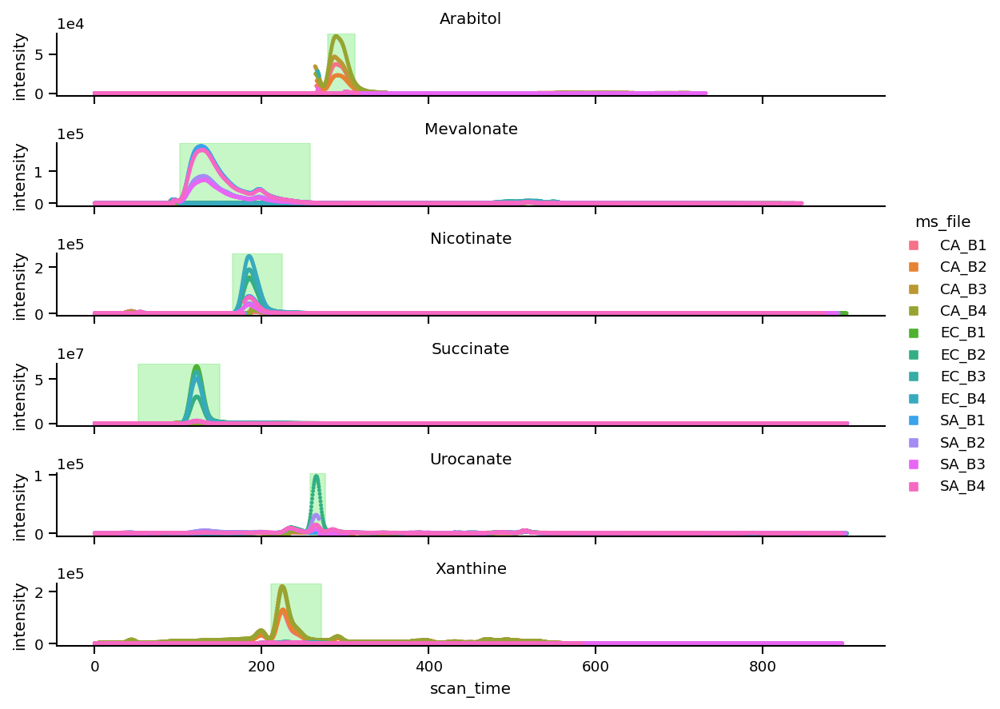

In [5]:
g = mint.plot.chromatogram(height=1, aspect=8)

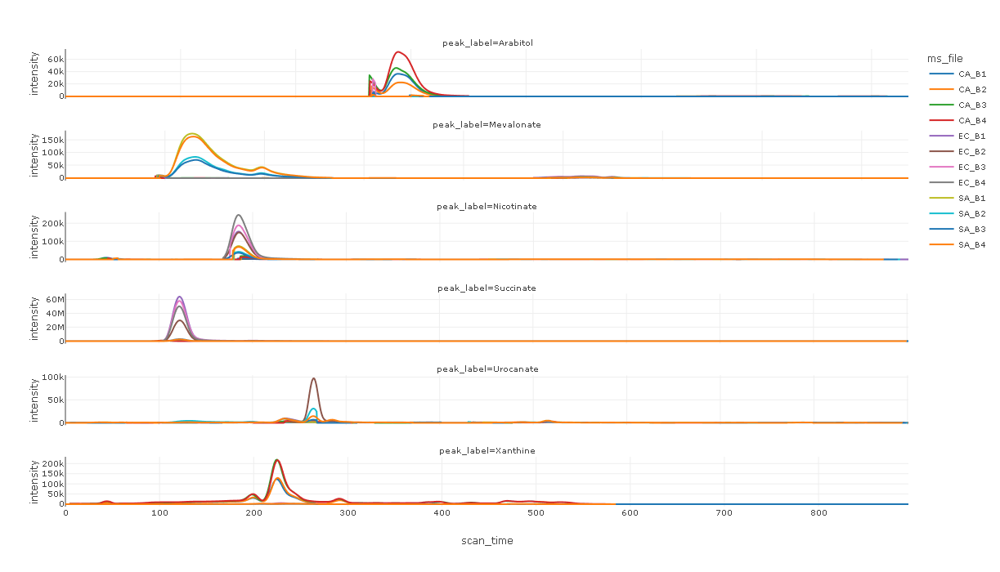

In [6]:
mint.plot.chromatogram(interactive=True)

## Plot peak shapes

/home/swacker/miniconda3/envs/ms-mint/lib/python3.10/site-packages/seaborn/axisgrid.py:88: UserWarning:

This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.



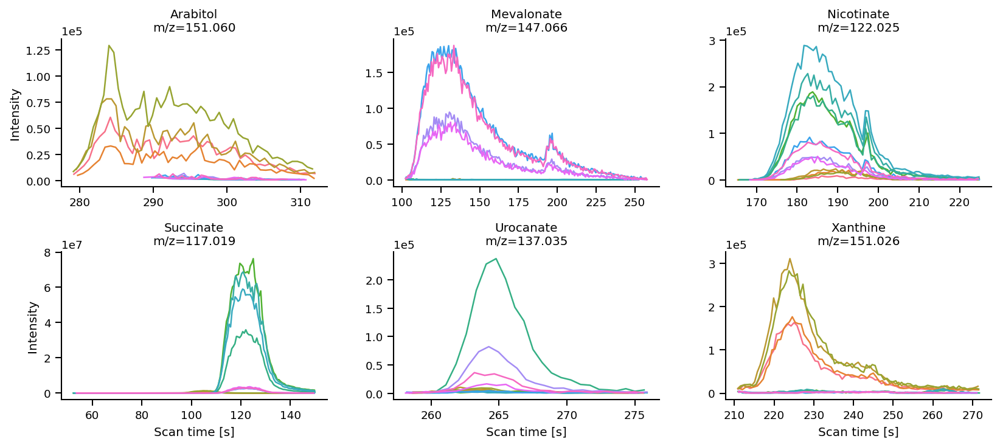

In [7]:
mint.plot.peak_shapes(col_wrap = 3, height=2.5, aspect=1.5)
plt.savefig('peak-shapes-before-opt.png', facecolor='w')

## Hierarchical clustering

/tmp/ipykernel_15243/2150954719.py:2: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  plt.savefig('hierarchical_clustering.png', facecolor='w', bbox_inches='tight')
/home/swacker/miniconda3/envs/ms-mint/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


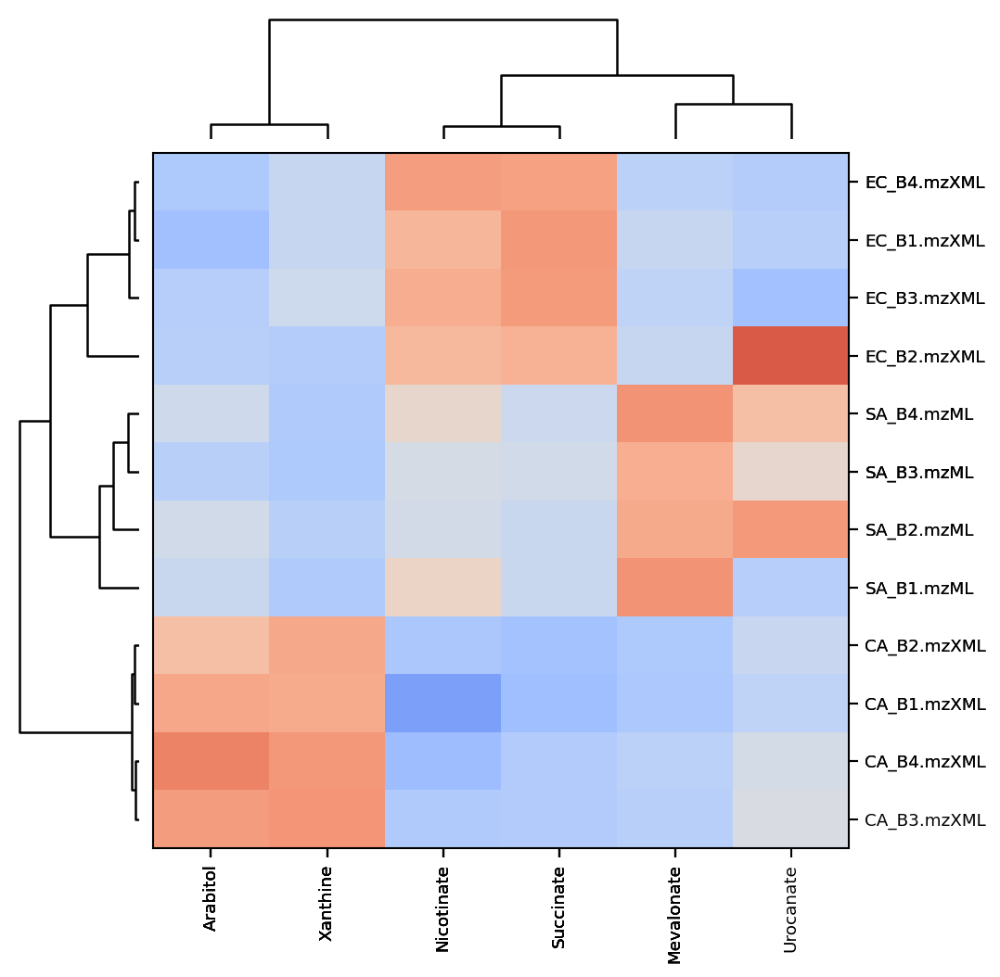

In [4]:
res = mint.plot.hierarchical_clustering(figsize=(6,6), top_height=1, left_width=1)
plt.savefig('hierarchical_clustering.png', facecolor='w', bbox_inches='tight')

## Principal Component Analysis

In [5]:
from pathlib import Path as P

In [6]:
labels = [P(fn).name.split('_')[0] for fn in mint.ms_files]
labels

['CA', 'CA', 'CA', 'CA', 'EC', 'EC', 'EC', 'EC', 'SA', 'SA', 'SA', 'SA']

In [7]:
mint.pca.run(3)

### Scatterplot matrix for PCA

/home/swacker/miniconda3/envs/ms-mint/lib/python3.10/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


<Figure size 900x600 with 0 Axes>

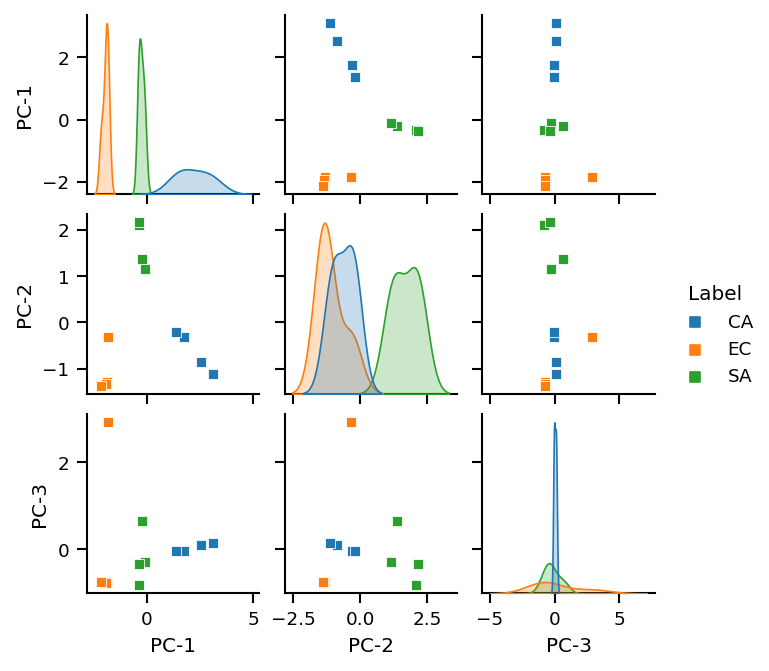

In [8]:
fig = mint.pca.plot.pairplot(labels=labels, height=1.5)
plt.savefig('pca-pairplot.png', facecolor='w')

### Interactive scatterplot matrix for PCA

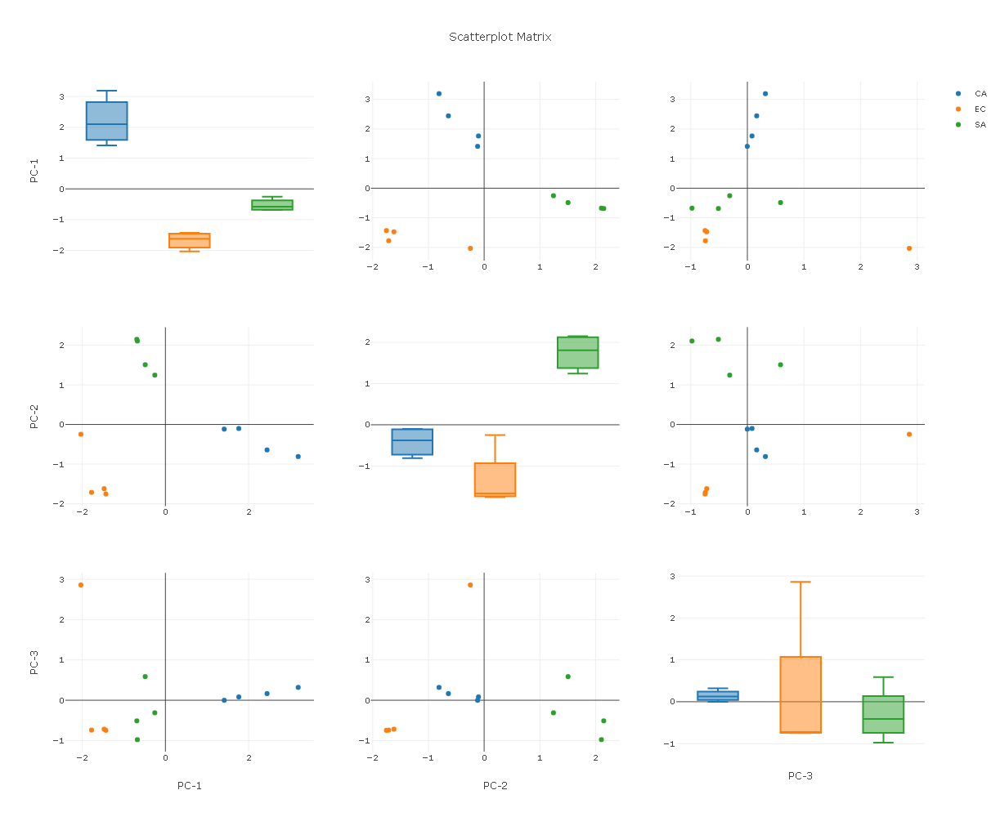

In [12]:
fig = mint.pca.plot.pairplot(n_vars=3, labels=labels, interactive=True, height=1000, width=1000, diag='box')
fig

### Cumulative explained variance plot

/tmp/ipykernel_15243/1833711114.py:2: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.savefig('pca-cumulative-variance.png')


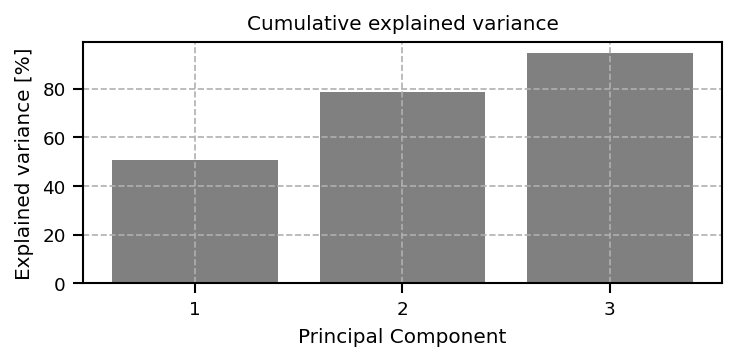

In [9]:
fig = mint.pca.plot.cumulative_variance(aspect=2, height=2.5)
plt.savefig('pca-cumulative-variance.png')
show()

### Plot feature contributions to PC's

/home/swacker/miniconda3/envs/ms-mint/lib/python3.10/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


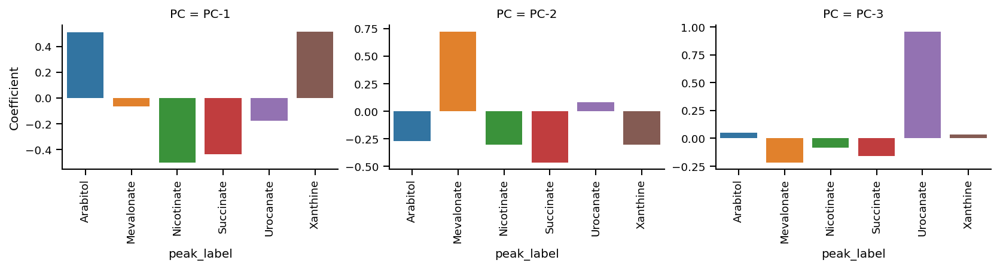

In [10]:
g = sns.catplot(data=mint.pca.results['feature_contributions'], x='peak_label', y='Coefficient', col='PC', kind='bar', 
                col_wrap=3, height=2.5, aspect=1.5, sharex=True, sharey=False)
g.set_xticklabels(rotation=90)

# 2D histogram

/home/swacker/miniconda3/envs/ms-mint/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


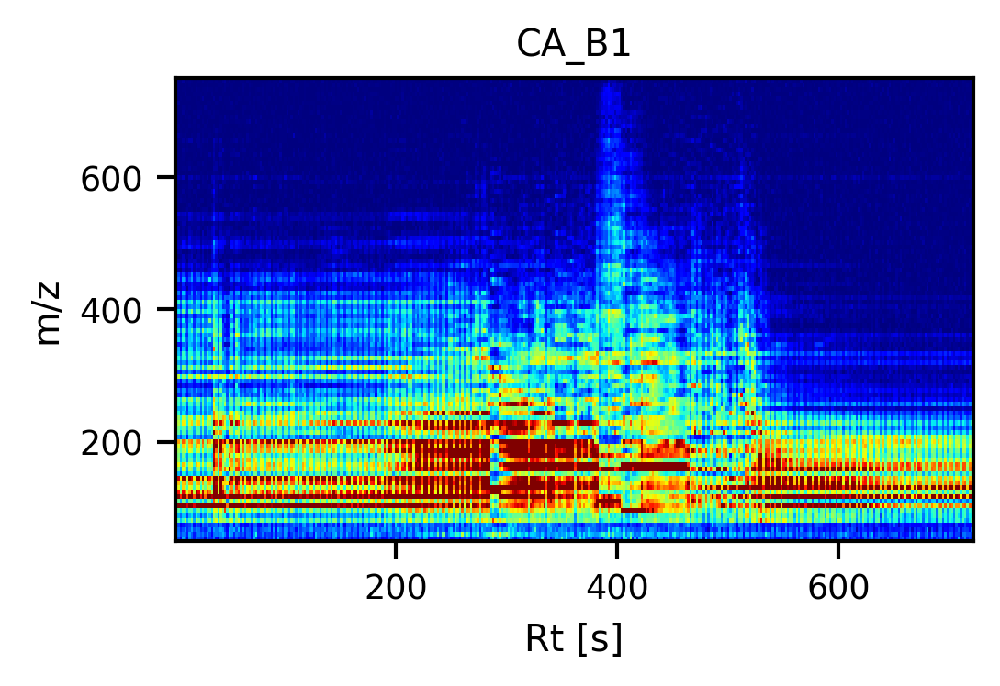

In [3]:
_ = mint.plot.histogram_2d(fn=mint.ms_files[0])

/home/swacker/miniconda3/envs/ms-mint/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


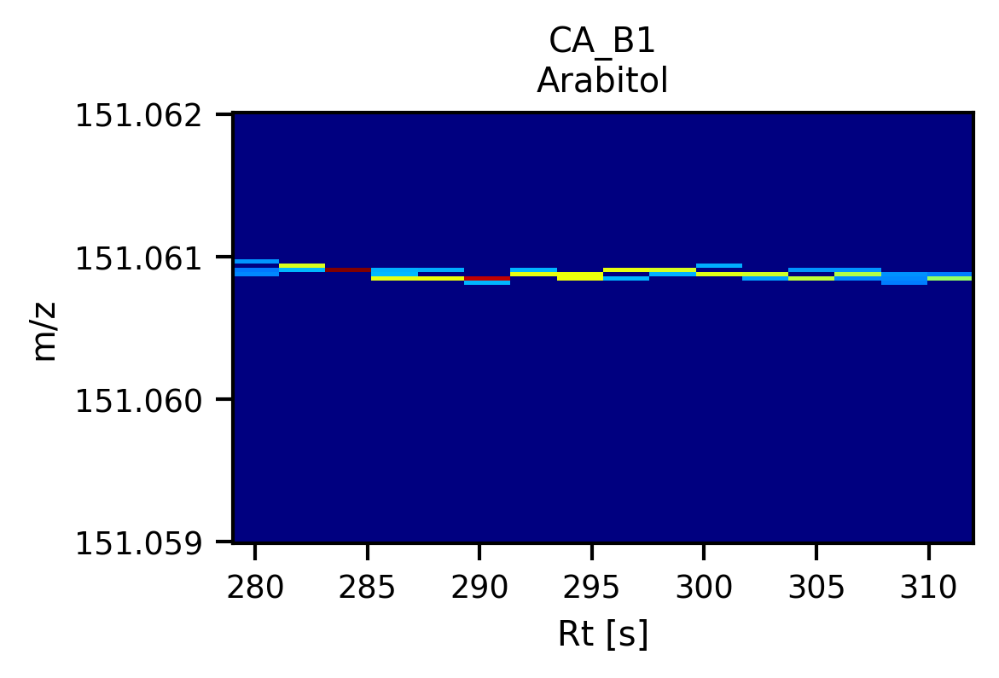

In [5]:
_ = mint.plot.histogram_2d(fn=mint.ms_files[0], peak_label='Arabitol',vmax=None)

/home/swacker/miniconda3/envs/ms-mint/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


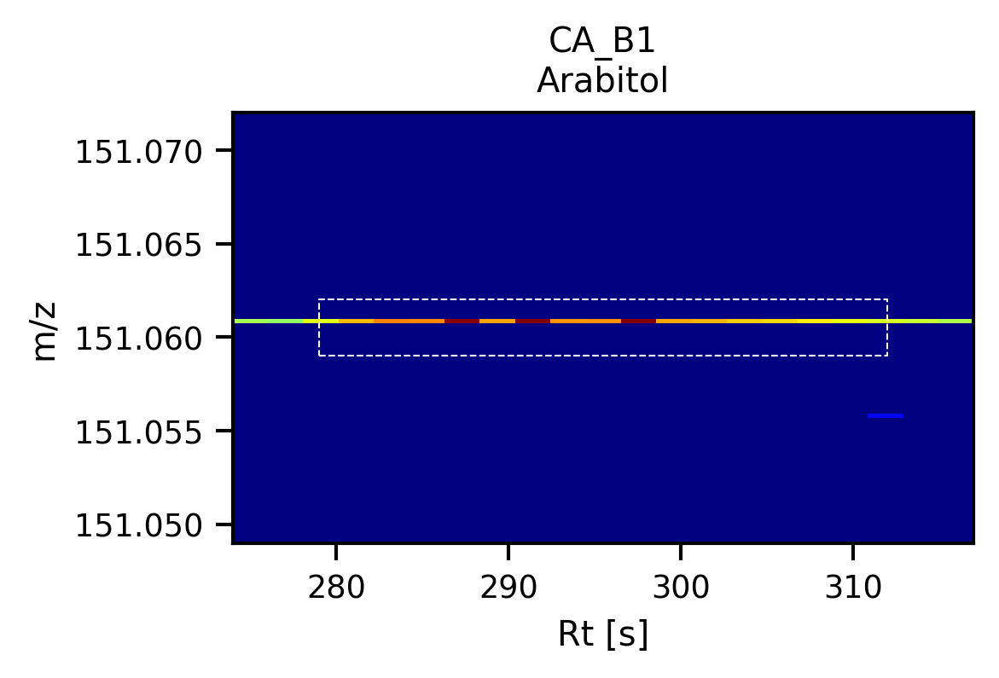

In [4]:
_ = mint.plot.histogram_2d(fn=mint.ms_files[0], peak_label='Arabitol',vmax=None, rt_margin=5, mz_margin=0.01)